In [2]:
import altair as alt
import pandas as pd
import glob, os
import warnings
warnings.filterwarnings('ignore')

alt.renderers.enable('notebook')
alt.data_transformers.enable('default', max_rows=None)

DataTransformerRegistry.enable('default')

In [27]:
### Load in data for issues and each page of all issues
df_issues = pd.read_csv('../data/arab_observer_1960_1962_stopwords_aggregating.csv')
df_pages = pd.read_csv('../data/arab_observer_1960_1962_stopwords.csv')
df_issues.month[df_issues.month == 'Oct'] = 'October'
df_issues.month[df_issues.month == 'Aug'] = 'August'
df_issues.month[df_issues.month == 'Sept'] = 'September'

,Unnamed: 0,vol,spacy_text,tokenized_text,spacy_counts,tokenized_counts,page_number,year,day,month,date
0,0,Data_Repository_Egyptian_Magazines_and_Periodi...,weekly 16 1961 1961/62 arab 16 1961 arab ger...,the weekly middle east news magazine a asia ir...,1487,14137,36,1961,16,April,1961-April-16
1,1,Data_Repository_Egyptian_Magazines_and_Periodi...,weekly arab 5 april 23 1961 11 two ras el ale...,the weekly middle east news magazine arab obse...,1265,11582,35,1961,23,April,1961-April-23
2,2,Data_Repository_Egyptian_Magazines_and_Periodi...,weekly arab april 2 1961 cairo 1961 african m...,the weekly middle east news magazine arab obse...,1096,11540,33,1961,2,April,1961-April-2
3,3,Data_Repository_Egyptian_Magazines_and_Periodi...,weekly 5 30 1961 23 25 1961 arab 30 1961 ara...,the weekly middle east news magazine asia rab ...,1498,11891,35,1961,30,April,1961-April-30
4,4,Data_Repository_Egyptian_Magazines_and_Periodi...,weekly bul 6 1961 arab 14 april 9 1961 israel ...,the weekly middle east news magazine bul 6 196...,1200,12375,35,1961,9,April,1961-April-9
5,5,Data_Repository_Egyptian_Magazines_and_Periodi...,weekly arab 11 uar august 13 1961 uar 2 8 1962...,blaustein library the weekly middle east news ...,1271,12102,33,1961,13,August,1961-August-13
6,6,Data_Repository_Egyptian_Magazines_and_Periodi...,weekly arab israel 24 11 20 1962 20 1961 3 a...,the weekly middle east news magazine asia arab...,1468,13766,35,1961,20,August,1961-August-20
7,7,Data_Repository_Egyptian_Magazines_and_Periodi...,weekly arab 201 israel 7 20 1962 27 1961 moha...,the weekly middle east news magazine arab obse...,1448,13845,35,1961,27,August,1961-August-27
8,8,Data_Repository_Egyptian_Magazines_and_Periodi...,weekly arab 11 uar august 13 1961 uar 2 8 1962...,blaustein library the weekly middle east news ...,311,3011,10,1961,11,December,1961-December-11
9,9,Data_Repository_Egyptian_Magazines_and_Periodi...,weekly arab 4 algerians december 18 1961 alger...,'' the weekly middle east news magazine arab o...,1247,12628,36,1961,18,December,1961-December-18


In [24]:
df_hathi = pd.read_csv('../data/hathi_trust_1963_1966_stopwords_aggregating.csv')


In [25]:
### join data frames
df_join = df_hathi.drop(['htrc_vol', 'second_month', 'second_month_index', 'spacy_text', 'tokenized_text'], axis=1)
df_join.rename(columns={'first_month': 'month'}, inplace=True)
df_join.rename(columns={'first_month_index': 'month_index'}, inplace=True)
df_join.rename(columns={'page': 'page_number'}, inplace=True)
df_join['day'] = '01'
df_join['date'] = df_join.date + '-' + df_join.day
df_join['type'] = 'hathi_trust'

df_join1 = df_issues.drop(['vol','spacy_text', 'tokenized_text', 'Unnamed: 0'], axis=1)
df_join1['month_index'] = pd.to_datetime(df_join1['month'], format='%B', errors='coerce').dt.month
df_join1['type'] = 'collected_issues'

df = pd.concat([df_join, df_join1])
df.columns

Index(['Unnamed: 0', 'date', 'day', 'month', 'month_index', 'page_number',
       'spacy_counts', 'tokenized_counts', 'type', 'year'],
      dtype='object')

In [131]:
df[0:2]

,Unnamed: 0,date,day,month,month_index,page_number,spacy_counts,tokenized_counts,year
0,0.0,1963-04-01,01,Apr,4,703,17241,178092,1963
1,1.0,1963-01-01,01,Jan,1,674,20321,193919,1963


In [32]:
grouped_spacy = df.groupby(['year', 'type'])['spacy_counts'].sum().reset_index()
grouped_pages = df.groupby(['year', 'type'])['page_number'].sum().reset_index()
grouped_tokens = df.groupby(['year', 'type'])['tokenized_counts'].sum().reset_index()

co = pd.merge(grouped_spacy, grouped_pages, on=['year', 'type'])
final_group = pd.merge(co, grouped_tokens, on=['year', 'type'])
melts = pd.melt(final_group, id_vars=['year', 'type'])
melts.columns

# final_group.to_csv('grouped_totals.csv')
# alt.Chart(melts).mark_bar().encode(
#     x=alt.X('year', axis=alt.Axis(title='Date of issue or volume')),
#     y=alt.Y('value', axis=alt.Axis(title='Number of words identified in the issue/volume')),
#     color='variable'
# ).properties(
#     title='Distribution of words across issues and volumes'
# )



Index(['year', 'type', 'variable', 'value'], dtype='object')

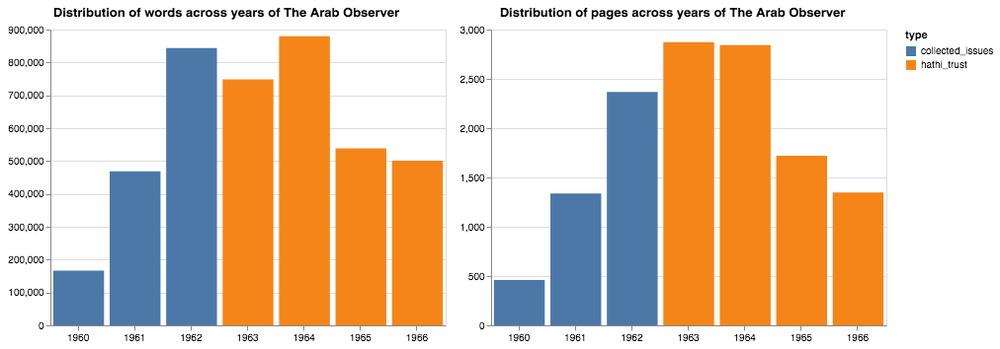

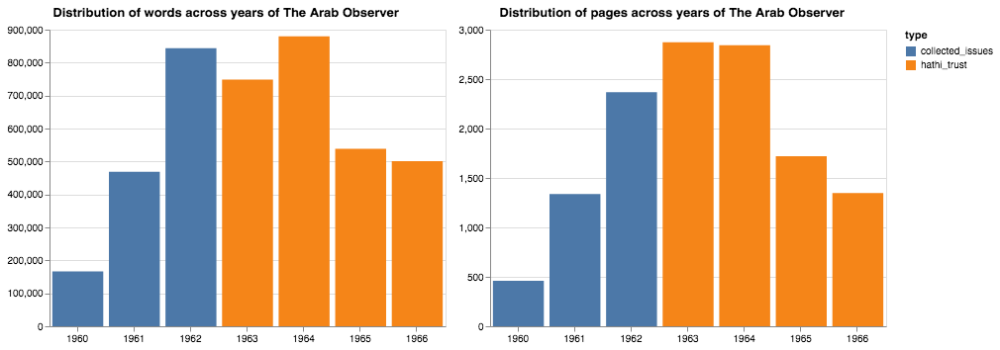

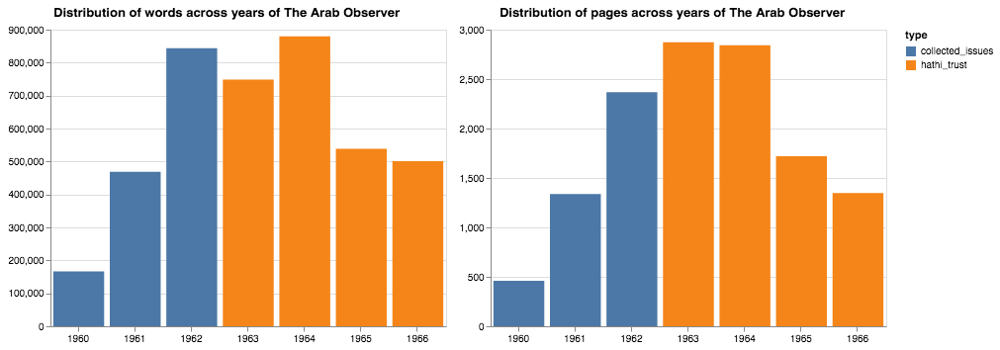

In [34]:
m = melts.loc[melts.variable == 'tokenized_counts']
m['year_string'] = m.year.astype(str)
bar = alt.Chart(m).mark_bar().encode(
    x=alt.X("year:N", axis=alt.Axis(title='', labelAngle=0)),
    y=alt.Y("value:Q", axis=alt.Axis(title='')),
    color=alt.Color("type:N")
).properties(
    title='Distribution of words across years of The Arab Observer',
    width=400
)
# rule = alt.Chart(m).mark_rule(color='black').encode(
#     y='mean(value):Q',
#     size=alt.value(2)
# )

m = melts.loc[melts.variable == 'page_number']
bar1 = alt.Chart(m).mark_bar().encode(
    x=alt.X("year:N", axis=alt.Axis(title='', labelAngle=0)),
    y=alt.Y("value:Q", axis=alt.Axis(title='')),
    color=alt.Color("type:N")
).properties(
    title='Distribution of pages across years of The Arab Observer',
    width=400
)
bar | bar1

In [105]:
m = melts.loc[melts.variable != 'spacy_counts']
alt.Chart(m).mark_point().encode(
    x=''
)

array(['page_number', 'tokenized_counts'], dtype=object)

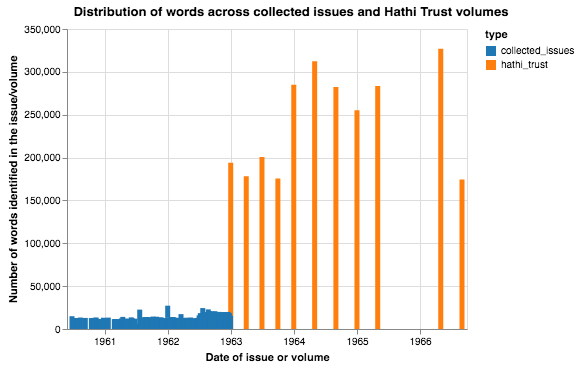

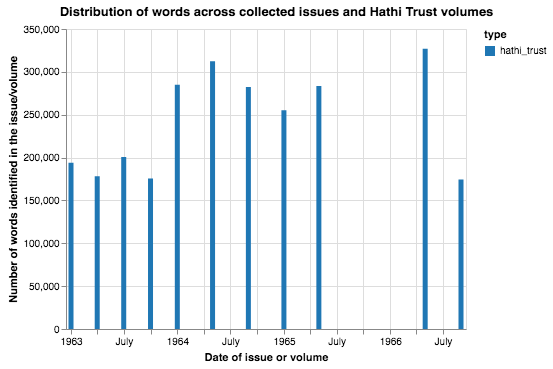

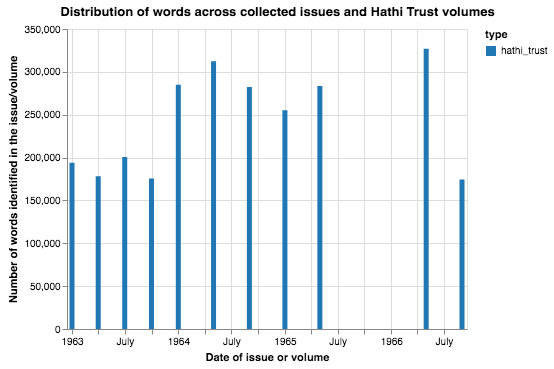

In [21]:
### Compare named entities to tokens identitfied with stopwords removed across all hathi and image lucida

melted_counts = pd.melt(df, id_vars=['page_number', 'year', 'day', 'month', 'date', 'month_index', 'Unnamed: 0', 'spacy_counts'], value_name='value')
# melted_counts.month = melted_counts.month.str.capitalize()

alt.Chart(df).mark_bar().encode(
    x=alt.X('date:T', axis=alt.Axis(title='Date of issue or volume')),
    y=alt.Y('tokenized_counts', axis=alt.Axis(title='Number of words identified in the issue/volume')),
    color=alt.Color('type', scale=alt.Scale(scheme='category10'))
).properties(
    title='Distribution of words across collected issues and Hathi Trust volumes'
)

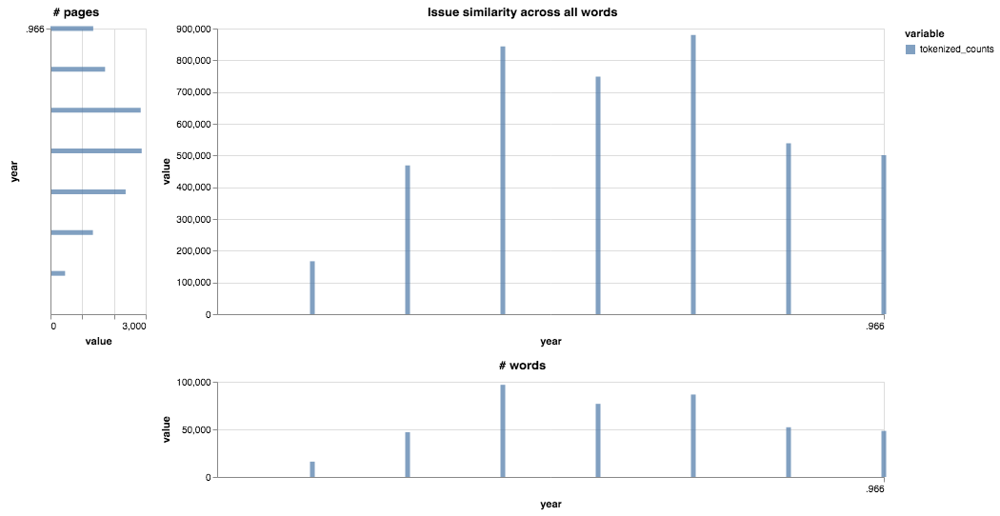

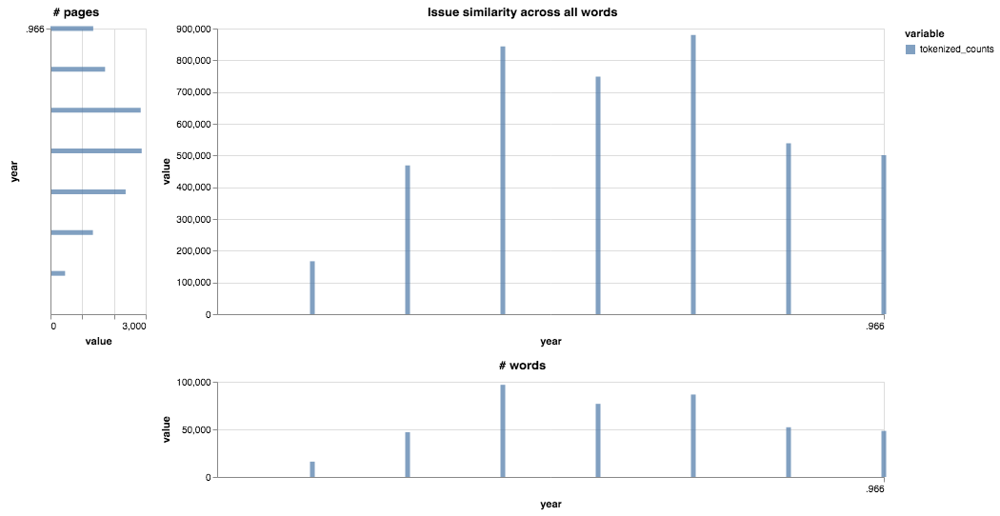

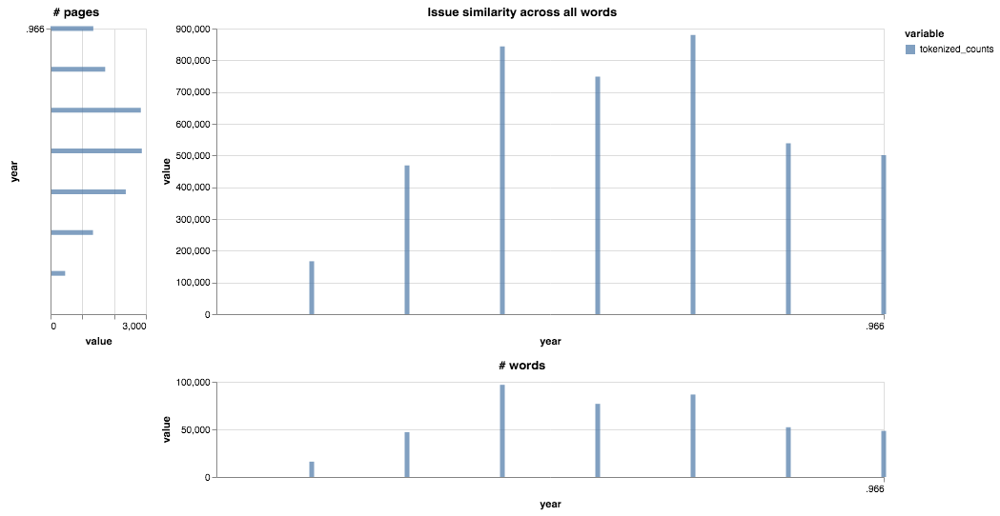

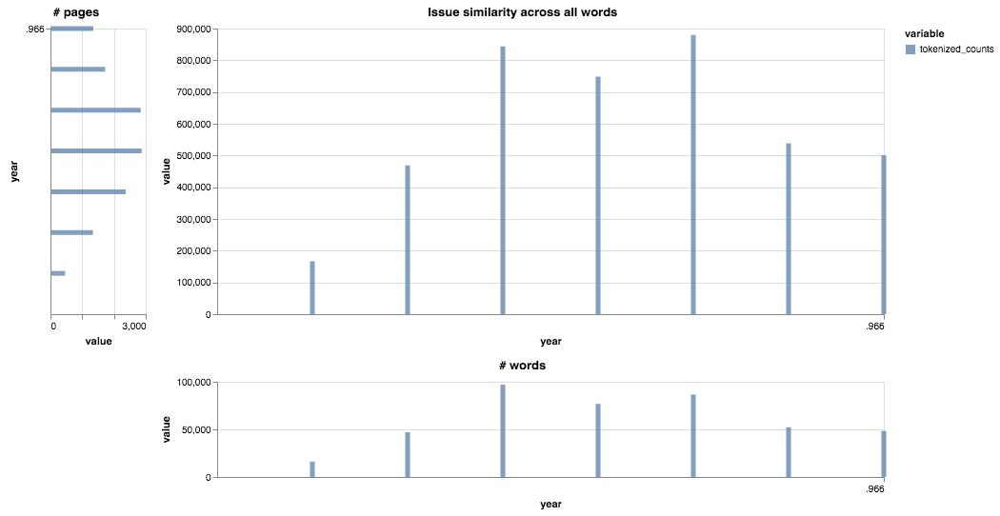

In [64]:
### Compare named entities to tokens identitfied with stopwords removed across all three years
# melted_counts = pd.melt(df, id_vars=[ 'year', 'day', 'month', 'date', 'month_index', 'Unnamed: 0'], value_name='value')
melted_counts = melts
melted_counts['string_date'] = melted_counts.year.astype(str)
pages = melted_counts.loc[melted_counts.variable == 'page_number']
all_terms = melted_counts.loc[melted_counts.variable == 'tokenized_counts']
words = melted_counts.loc[melted_counts.variable == 'spacy_counts']
from altair.expr import datum, if_
pts = alt.selection(type="single", fields=['year'])
color = alt.condition(pts,
                      alt.Color('variable:N'),
                      alt.value('lightgray'))

lines = alt.Chart(all_terms).mark_bar(opacity=0.7).encode(
    x=alt.X('year:T'),
    y='value',
    color=color,
    tooltip=['string_date', 'value']
).properties(
    title='Issue similarity across all words',
    width=700,
    height=300,
)
x_ticks = alt.Chart(words).mark_bar(opacity=0.7).encode(
    x=alt.X('year:T'),
    y=alt.Y('value', stack=None),
    tooltip=['string_date', 'value']
).properties(
    width=700,
    height=100,
    selection=pts,
    title='# words'
)
y_ticks = alt.Chart(pages).mark_bar(opacity=0.7).encode(
    x=alt.X('value'),
    y=alt.Y('year:T', stack=None),
    tooltip=['string_date', 'value']
).properties(
    width=100,
    height=300,
    selection=pts,
    title='# pages'
)
y_ticks | (lines & x_ticks)


In [120]:
grouped_tokens = df.groupby(['year'])['tokenized_counts'].sum().reset_index()
grouped_spacy = df.groupby(['year'])['spacy_counts'].sum().reset_index()
grouped_pages = df.groupby(['year'])['page_number'].count().reset_index()
d1 = pd.merge(grouped_tokens, grouped_spacy, on=['year'])
d2 = pd.merge()

TypeError: merge() missing 2 required positional arguments: 'left' and 'right'

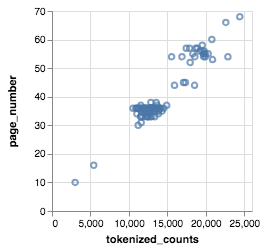

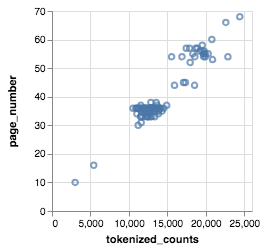

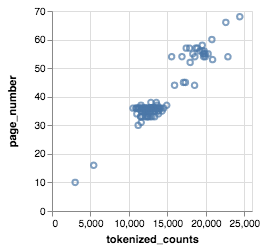

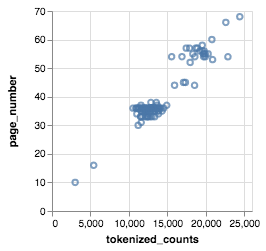

In [108]:
### Correlation between page number, named entities, and token counts per year
pages_spacy = alt.Chart(df_issues).mark_circle().encode(
    x='page_number',
    y='spacy_counts',
).properties(
    width=200,
    height=200,
)

tokens_spacy =alt.Chart(df_issues).mark_circle().encode(
    x='spacy_counts',
    y='tokenized_counts',
).properties(
    width=200,
    height=200,
)

pages_tokens = alt.Chart(df_issues).mark_point().encode(
    x='tokenized_counts',
    y='page_number',
).properties(
    width=200,
    height=200,
)

pages_tokens

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

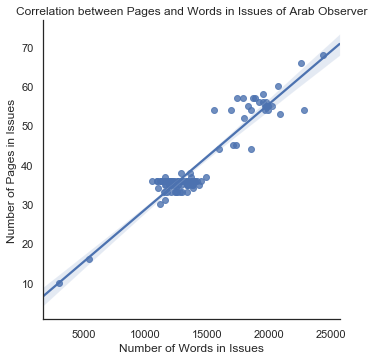

In [127]:
sns.set_style("white")

g = sns.lmplot(x='tokenized_counts', y='page_number', data=df_issues)

axes = g.axes.flatten()
axes[0].set_title('Correlation between Pages and Words in Issues of Arab Observer')
axes[0].set_ylabel('Number of Pages in Issues')
axes[0].set_xlabel('Number of Words in Issues')
g.savefig('test.png')

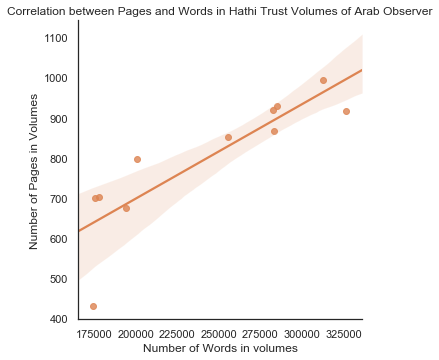

In [55]:
hathi = df.loc[df.type == 'hathi_trust']
sns.set_style("white")
hue_order = ['collected_issues', 'hathi_trust']
g = sns.lmplot(x='tokenized_counts', y='page_number', hue='type', hue_order=hue_order, data=hathi, legend=False)

axes = g.axes.flatten()
axes[0].set_title('Correlation between Pages and Words in Hathi Trust Volumes of Arab Observer')
axes[0].set_ylabel('Number of Pages in Volumes')
axes[0].set_xlabel('Number of Words in volumes')
g.savefig('hathi_corr.png')

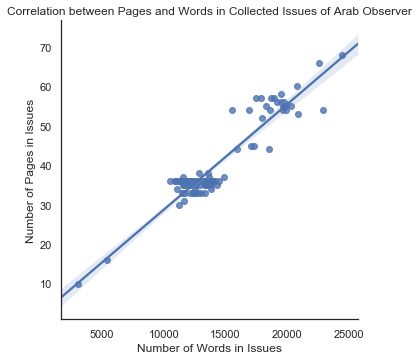

In [53]:
hathi = df.loc[df.type == 'collected_issues']
sns.set_style("white")
hue_order = ['collected_issues', 'hathi_trust']
g = sns.lmplot(x='tokenized_counts', y='page_number', hue='type', hue_order=hue_order, data=hathi, legend=False)

axes = g.axes.flatten()
axes[0].set_title('Correlation between Pages and Words in Collected Issues of Arab Observer')
axes[0].set_ylabel('Number of Pages in Issues')
axes[0].set_xlabel('Number of Words in Issues')
g.savefig('issues_corr.png')

In [56]:
import statsmodels.api as sm

X = hathi["page_number"]
y = hathi['tokenized_counts']

# Note the difference in argument order
model = sm.OLS(y, X).fit()
predictions = model.predict(X) # make the predictions by the model

# Print out the statistics
model.summary()

/Users/zgl3n/.local/share/virtualenvs/CRDH-R-3_7VyR/lib/python3.6/site-packages/scipy/stats/stats.py:1394: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  "anyway, n=%i" % int(n))


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       tokenized_counts   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     729.8
Date:                Sat, 13 Oct 2018   Prob (F-statistic):           1.12e-10
Time:                        10:24:55   Log-Likelihood:                -128.61
No. Observations:                  11   AIC:                             259.2
Df Residuals:                      10   BIC:                             259.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
page_number   304.0992     11.257     27.015      0.000     279.018     329.180
==============================================================================
Omnibus:                        0.383   Durbin-Watson:                   0.508
Prob(Omnibus):                  0.826   Jarque-Bera (JB):                0.474
Skew:                           0.149   Prob(JB):                        0.789
Kurtosis:                       2.028   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [4]:
docs = pd.read_csv('../data/combined_all_data_1960_1966_binned_congo_classified_clean.csv')
docs.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1', 'date', 'day', 'month',
       'month_index', 'months', 'page_number', 'spacy_counts', 'spacy_text',
       'string_date', 'tokenized_counts', 'word_count', 'year', 'years',
       'datetime', 'binned', 'classify', 'tokenized_text'],
      dtype='object')

In [6]:
df_grouped = docs.groupby(['date', 'binned'])['tokenized_counts'].sum().reset_index()

In [30]:
df_grouped['date_bin'] = df_grouped.date.astype(str) +'_' +df_grouped.binned.astype(str)
df_grouped['datetime'] = pd.to_datetime(df_grouped['date'], format='%Y-%B-%d', errors='coerce')
df_grouped.sort_values(by=['datetime'], inplace=True)
df_grouped['type'] = ''
df_grouped.type[df_grouped.datetime > '1962-12-29'] = 'hathi_trust'
df_grouped.type[df_grouped.datetime < '1963-01-01'] = 'collected_issues'
df_grouped.rename(columns={'date_bin': 'Issues/Volumes across bins', 'tokenized_counts': 'word counts per bin'}, inplace=True)

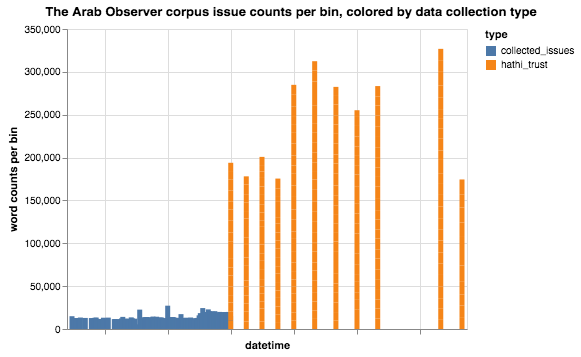

In [32]:
alt.Chart(df_grouped).mark_bar().encode(
    x=alt.X('datetime:T', axis=alt.Axis(labels=False)),
    y='word counts per bin',
    color='type'
).properties(
    width=400,
    title='The Arab Observer corpus issue counts per bin, colored by data collection type'
)